<a href="https://colab.research.google.com/github/jrebull/Vision/blob/main/Team_13_MNA_Vision_3_2_Dominio_Espacial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 4. Convolución de imagenes

## Tabla de contenidos
1. [Libraries](#libraries)
2. [Simple Example](#simple)
3. [PyTorch Convolution](#pytorch)

## Importando Librerias <a class="anchor" id="libraries" ></a>

In [ ]:
import gdown
import matplotlib.pyplot as plt
import numpy as np
import os
import torch, torchvision

from PIL import Image
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from torchvision import transforms
from torch import nn




In [ ]:
nombre_carpeta = "Imagenes_dominio_espacial"

ruta_imagenes = os.path.join(os.getcwd(), nombre_carpeta)

if not os.path.exists(ruta_imagenes):
    os.makedirs(ruta_imagenes)
    print(f"Carpeta '{nombre_carpeta}' creada en: {ruta_imagenes}")
else:
    print(f"La carpeta '{nombre_carpeta}' ya existe en: {ruta_imagenes}")

La carpeta 'Imagenes_dominio_espacial' ya existe en: /home/jarcos/Imagenes_dominio_espacial


In [ ]:
id_kinkakuji = '18Bh82UfYGRBkl5xG7OjiNjm9oIozJeqf'
imagen = 'Kinkakuji.JPEG'
ruta_kinkakuji = os.path.join(ruta_imagenes, imagen)

gdown.download(id=id_kinkakuji, output=ruta_kinkakuji, quiet=True)

'/home/jarcos/Imagenes_dominio_espacial/Kinkakuji.JPEG'

## Convolución simple<a class="anchor" id="simple" ></a>

### Definición

- __I__: Imagen de entrada que será convolucionada.
- __H__: Matriz de filtro (o kernel) que define la operación de convolución
- __J__: Imagen resultante tras aplicar la convolución.

La operación de convolución consiste en deslizar la matriz de filtro __H__ sobre la imagen de entrada __I__, realizando una serie de multiplicaciones y sumas en cada posición. En cada paso:

1.   **Superposición**: El filtro H se posiciona sobre una región específica de la imagen I.
2.  **Multiplicación** elemento a elemento: Cada valor del filtro se multiplica por el valor correspondiente de la imagen que queda "debajo".
3.    **Suma acumulada**: Los productos se suman para obtener un único valor.
4.    **Asignación**: Este valor se escribe en la imagen de salida J, generalmente en la posición correspondiente al centro del filtro H.
Este proceso se repite desplazando el filtro por toda la imagen, generando una nueva imagen J que resalta características específicas como bordes, texturas o patrones, dependiendo de los valores definidos en H


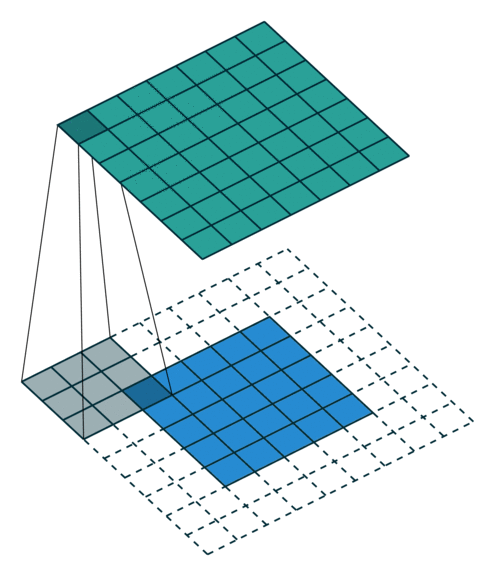

**Implementación de la convolución con un filtro de bloque**

Para implementar la operación de convolución utilizando un filtro de bloque, se requieren dos métodos fundamentales:
- **Generación del filtro**: El primer método construye la matriz de filtro __H__, cuya dimensión depende del parámetro __n__, que define tanto el ancho como la altura del filtro (es decir, un filtro de tamaño $n × n$).
- **Aplicación de la convolución**: El segundo método aplica la matriz __H__ sobre la imagen de entrada, siguiendo la lógica de la operación de convolución.

**¿Qué es un filtro de bloque?**

Un filtro de bloque es una matriz uniforme en la que todos los elementos tienen el mismo valor. Este valor es:

$\dfrac{1}{n \cdot n}$

Esto garantiza que la suma total de los elementos del filtro sea igual a 1, lo que permite realizar un promedio local sin alterar el brillo global de la imagen.


El siguiente código define una función llamada block_filter, cuyo propósito es generar una matriz de filtro de bloque de tamaño $n × n$. Este tipo de filtro se utiliza frecuentemente en el procesamiento de imágenes para aplicar operaciones de suavizado o promedio local, reduciendo variaciones de intensidad entre píxeles vecinos.

- `n` representa un número entero que determina tanto el ancho como la altura del filtro.
- `np.ones((n, n))` crea una matriz de tamaño $n × n$ llena de unos.
- Luego, se divide cada elemento por $n * n$, lo que convierte todos los valores en $\frac{1}{n^2}$


In [ ]:
def block_filter(n):
    H = np.ones((n, n)) / (n * n) # cada elemento tiene el valor 1/(n*n)
    return H

Ejemplo de filtro de bloque con ``n = 5``:

In [ ]:
H = block_filter(5)
print(H)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


A continuación, se define la operación de convolución aplicada a imágenes. Para evitar errores por índices fuera de rango en los bordes de la imagen, se introduce un parámetro de relleno denotado como __p__. Este relleno permite extender artificialmente los bordes de la imagen, asegurando que el filtro pueda aplicarse de manera uniforme en toda su superficie sin perder información estructural.

El valor de __p__ depende del tamaño del filtro utilizado. Por ejemplo, para un filtro de tamaño $n × n$, suele aplicarse un relleno de:


$$p = \left\lfloor \frac{n}{2} \right\rfloor$$

Esto garantiza que el centro del filtro pueda alinearse con cada píxel de la imagen, incluso en las esquinas.

In [ ]:
def apply_filter(I, H):
    h, w = I.shape                         # dimensiones de la imagen (alto, ancho)
    n = H.shape[0]                         # tamaño del filtro
    p = n // 2                             # tamaño del relleno (padding)
    J = np.zeros_like(I)                   # imagen de salida, inicializada en ceros

    for x in range(p, h-p):
        for y in range(p, w-p):
            J[x, y] = np.sum(I[x-p:x+n-p, y-p:y+n-p] * H)
    return J

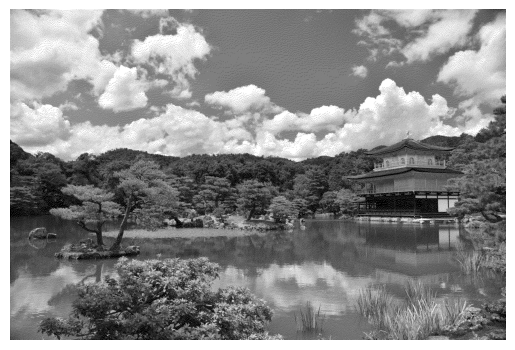

Objeto: <PIL.Image.Image image mode=1 size=1620x1080 at 0x7F65C31B9160>
Formato: None
Tamaño (Ancho x Alto): (1620, 1080)
Modo de color: 1
Número total de valores en el arreglo: 1,749,600
Número de dimensiones del arreglo: 2


In [ ]:
image = Image.open(ruta_kinkakuji)
image = image.convert('1') # convertir imagen a blanco y negro

plt.imshow(image, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')
plt.show()

print(f"Objeto: \033[36m{image}\033[0m")
print(f"Formato: \033[36m{image.format}\033[0m")
print(f"Tamaño (Ancho x Alto): \033[36m{image.size}\033[0m")
print(f"Modo de color: \033[36m{image.mode}\033[0m")

image = np.array(image)

print(f"Número total de valores en el arreglo: \033[36m{image.size:,}\033[0m")
print(f"Número de dimensiones del arreglo: \033[36m{image.ndim}\033[0m")


In [ ]:
image = image.astype(float)

A continuación, se aplica un filtro de bloque de tamaño $7 × 7$ sobre la imagen de entrada. Este filtro permite realizar un suavizado uniforme, reemplazando cada píxel por el promedio de sus vecinos en una ventana de $7 × 7$.


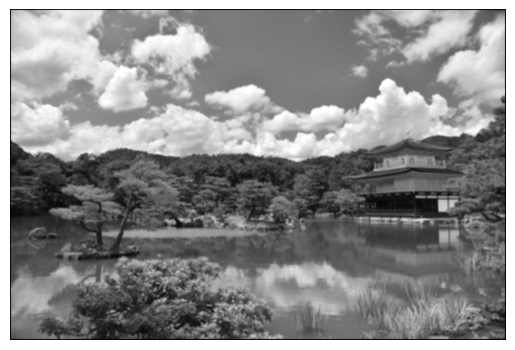

In [ ]:
n = 7
H = block_filter(n)
J = apply_filter(image, H)

plt.imshow(J, cmap='gray')
plt.axis('off')
plt.show()

## PyTorch Convolution <a class="anchor" id="pytorch" ></a>

In [ ]:
img = Image.open(ruta_kinkakuji)
print("Información original de la imagen")
print(f"Objeto: \033[36m{img}\033[0m")
print(f"Formato: \033[36m{img.format}\033[0m")
print(f"Tamaño (Ancho x Alto): \033[36m{img.size}\033[0m")
print(f"Modo de color: \033[36m{img.mode}\033[0m")

img.thumbnail((810,540), Image.Resampling.LANCZOS) #  Redimensionar a la mitad para reducir el tamaño.

print("\nInformación de la imagen redimensionada:")
print(f"Objeto: \033[36m{img}\033[0m")
print(f"Formato: \033[36m{img.format}\033[0m")
print(f"Tamaño (Ancho x Alto): \033[36m{img.size}\033[0m")
print(f"Modo de color: \033[36m{img.mode}\033[0m")

Información original de la imagen
Objeto: <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1620x1080 at 0x7F65C101B890>
Formato: JPEG
Tamaño (Ancho x Alto): (1620, 1080)
Modo de color: RGB

Información de la imagen redimensionada:
Objeto: <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=810x540 at 0x7F65C101B890>
Formato: JPEG
Tamaño (Ancho x Alto): (810, 540)
Modo de color: RGB


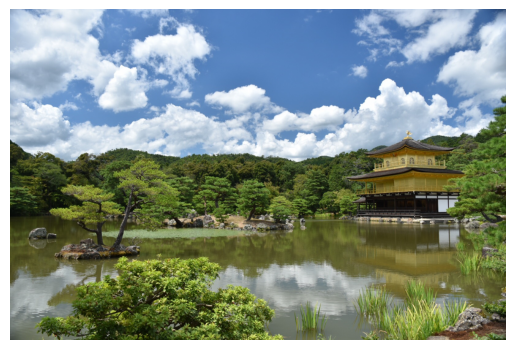

In [ ]:
plt.imshow(img, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')
plt.show()

Se definen los siguientes dos pipelines de transformación:

**to_tensor**

Este pipeline convierte una imagen PIL en un tensor normalizado en escala de grises:
*  `transforms.Grayscale()` - Convierte la imagen a escala de grises. Por defecto, genera una imagen de 1 canal (intensidad luminosa). Si la imagen original era RGB, se reduce a un solo canal.
*  `transforms.ToTensor()` - Convierte la imagen PIL (o NumPy array) en un tensor de PyTorch.
Además, normaliza los valores de píxeles de [0, 255] a [0.0, 1.0] como float32.

**to_pil**

Este pipeline convierte un tensor de PyTorch de vuelta a una imagen PIL
*  `transforms.ToPILImage()` - Toma un tensor y lo convierte en una imagen PIL.

In [ ]:
to_tensor = transforms.Compose([
   transforms.Grayscale(),  # Convierte la imagen a escala de grises (1 canal).
   transforms.ToTensor()    # Convierte la imagen PIL [0–255] a tensor float [0.0–1.0].
])

to_pil = transforms.Compose([
    transforms.ToPILImage()
])

**Interpretación de input.shape**

El resultado de input.shape indica lo siguiente:
- $1$: número de canales — la imagen está en escala de grises.
- $540$: altura de la imagen, en píxeles.
- $810$: ancho de la imagen, en píxeles.

En PyTorch, los tensores de imágenes se representan con la forma (C, H, W), donde:

- $C$ es el número de canales (1 para escala de grises, 3 para RGB),
- $H$ es la altura,
- $W$ es el ancho.


In [ ]:
input = to_tensor(img)
input.shape

torch.Size([1, 540, 810])

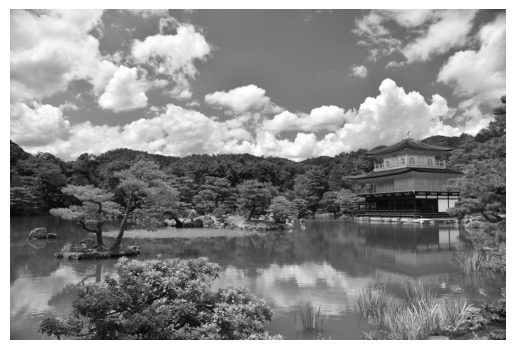


Información de la imagen redimensionada:
Objeto: <PIL.Image.Image image mode=L size=810x540 at 0x7F65C31CBE90>
Formato: None
Tamaño (Ancho x Alto): (810, 540)
Modo de color: L


In [ ]:
pil = to_pil(input)

plt.imshow(pil, cmap='gray')
plt.axis('off')
plt.show()

print("\nInformación de la imagen redimensionada:")
print(f"Objeto: \033[36m{pil}\033[0m")
print(f"Formato: \033[36m{pil.format}\033[0m")
print(f"Tamaño (Ancho x Alto): \033[36m{pil.size}\033[0m")
print(f"Modo de color: \033[36m{pil.mode}\033[0m")

El siguiente código aplica un filtro sobre una imagen en escala de grises, manteniendo las dimensiones originales gracias al uso de relleno (`padding`).

+ `in_channels = 1`: la entrada es una imagen en escala de grises (1 canal).
+ `out_channels = 1`: la salida también será una imagen en escala de grises.
+ `kernel_size = (3, 3)`: el tamaño del kernel (filtro) es de $3 × 3$ píxeles
+ `stride = 1`: el paso de la correlación cruzada es de 1 píxel en cada dirección.
+ `padding = 1`: se aplica relleno con ceros de 1 píxel en cada borde (horizontal y vertical).
+ `bias = False`: No se incluye el parámetro de sesgo (`bias`), lo que permite centrar la operación únicamente en el efecto del filtro, sin añadir desplazamientos adicionales en el resultado.


In [ ]:
conv = nn.Conv2d(1, 1, (3, 3), stride=1, padding=1, bias=False)

In [ ]:
conv(input)

tensor([[[ 0.1044,  0.0305,  0.0297,  ...,  0.0239,  0.0272, -0.0004],
         [ 0.1811, -0.0211, -0.0230,  ...,  0.0049,  0.0071,  0.0065],
         [ 0.1812, -0.0241, -0.0224,  ...,  0.0006, -0.0114, -0.0024],
         ...,
         [ 0.0873, -0.0189, -0.0171,  ..., -0.0238, -0.0153,  0.0021],
         [ 0.0821, -0.0158, -0.0120,  ..., -0.0165, -0.0138,  0.0025],
         [ 0.0744, -0.0636, -0.0639,  ..., -0.0410, -0.0338, -0.0393]]],
       grad_fn=<SqueezeBackward1>)

El siguiente código está añadiendo una dimensión adicional al tensor input en la posición 0. Es una operación común en PyTorch cuando necesitas preparar una imagen para ser procesada por una red neuronal que espera un lote (batch) de entradas.

Las redes convolucionales en PyTorch esperan entradas en formato 4D: una colección de imágenes (batch), cada una con canales, alto y ancho.


In [ ]:
input_unsqueeze = input.unsqueeze(0)
input_unsqueeze.shape

torch.Size([1, 1, 540, 810])

In [ ]:
output = conv(input_unsqueeze)
output.shape

torch.Size([1, 1, 540, 810])

Setting `padding=1` in the convolution layer, we obtain an image of the same size.

In [ ]:
output.shape

torch.Size([1, 1, 540, 810])

We need to remove the first dimension before converting to a PIL object.

In [ ]:
output.data.squeeze(dim=0).shape

torch.Size([1, 540, 810])

Display the output from the convolution layer by converting `output` to a PIL object.

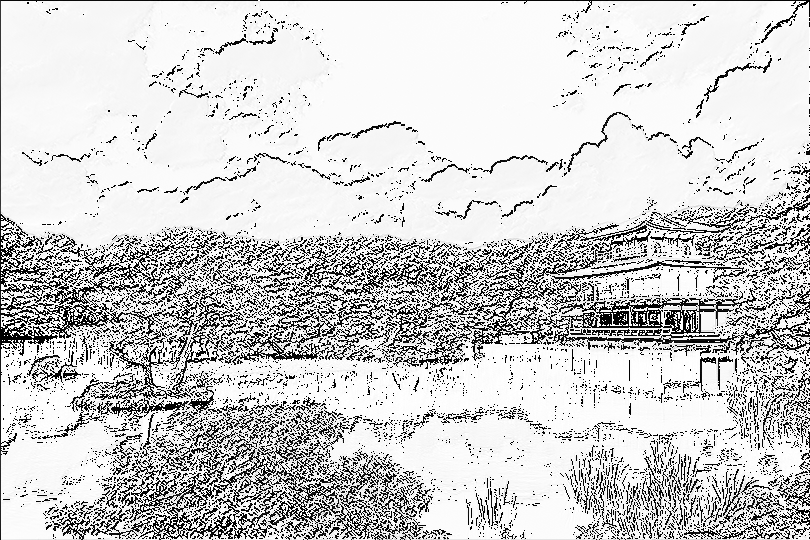

In [ ]:
to_pil(output.data.squeeze(dim=0))

Clip every value in the output tensor within the range of [0, 1].

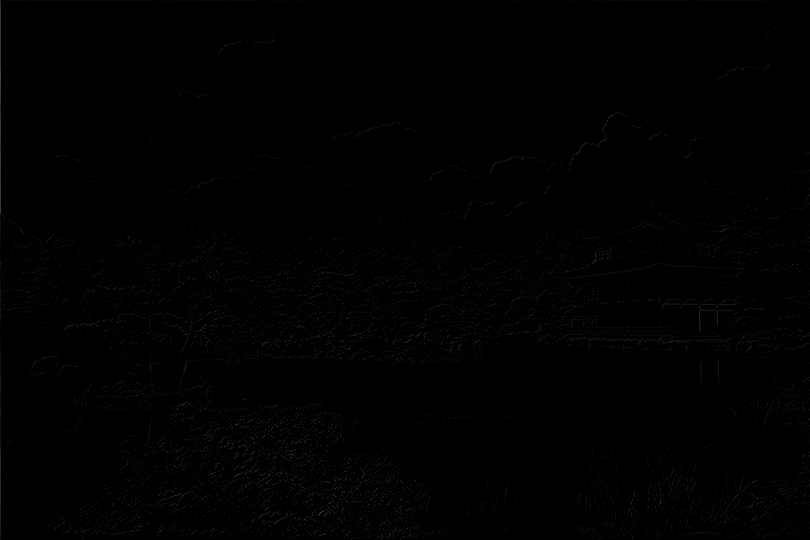

In [ ]:
to_pil(torch.clamp(output, 0, 1).data.squeeze(dim=0))

In [ ]:
def display(img1, img2):
    im1 = to_pil(torch.clamp(img1, 0, 1).data.squeeze(dim=0))
    im2 = to_pil(torch.clamp(img2, 0, 1).data.squeeze(dim=0))
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

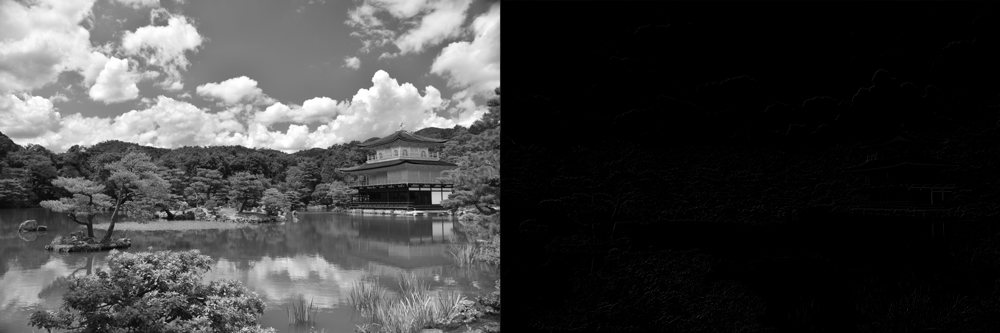

In [ ]:
display(input, output)

### Identity

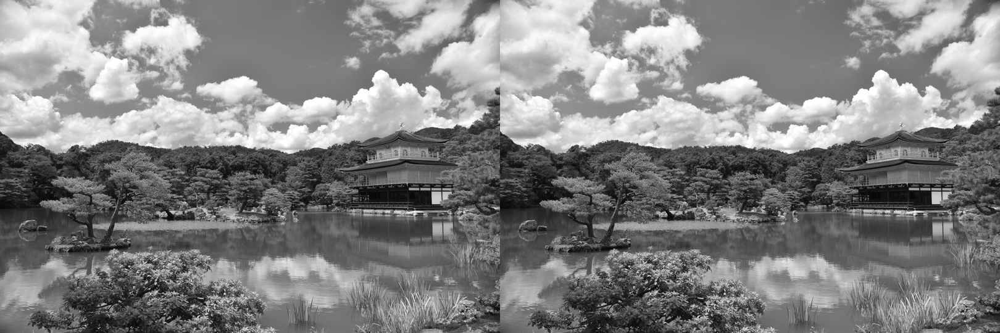

In [ ]:
conv.weight.data = torch.tensor([[[
    [0., 0., 0.],
    [0., 1, 0.],
    [0., 0., 0.],
]]])

output = conv(input)
display(input, output)

### Brighten

tensor([[[[0.0000, 0.0000, 0.0000],
          [0.0000, 1.5000, 0.0000],
          [0.0000, 0.0000, 0.0000]]]])


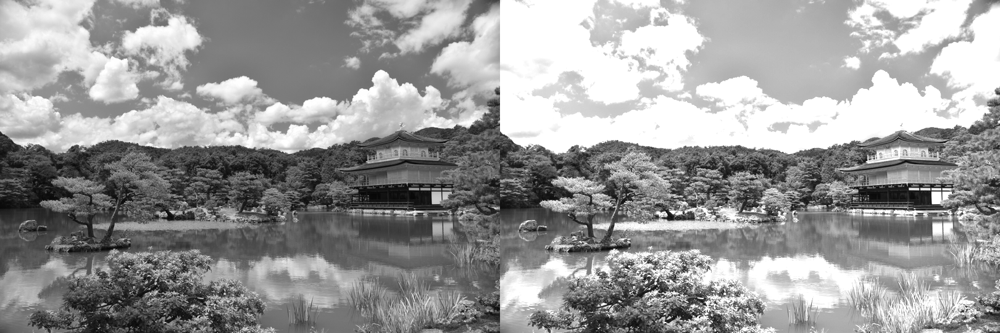

In [ ]:
conv.weight.data = torch.tensor([[[
    [0., 0., 0.],
    [0., 1.5, 0.],
    [0., 0., 0.],
]]])
print(conv.weight.data)
output = conv(input)
display(input, output)

### Darken

tensor([[[[0.0000, 0.0000, 0.0000],
          [0.0000, 0.5000, 0.0000],
          [0.0000, 0.0000, 0.0000]]]])


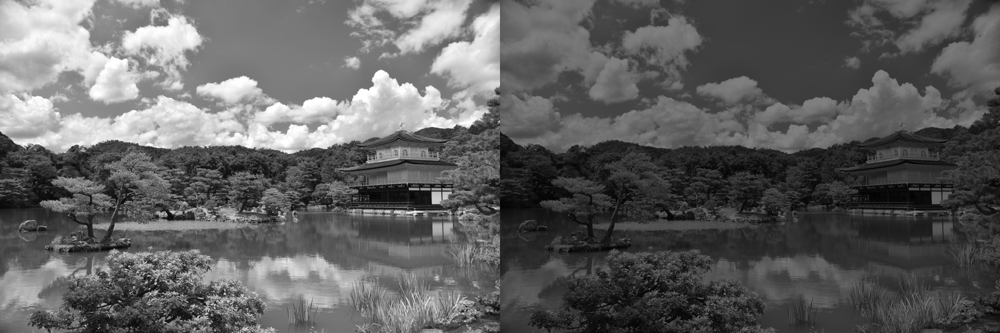

In [ ]:
conv.weight.data = torch.tensor([[[
    [0., 0., 0.],
    [0., 0.5, 0.],
    [0., 0., 0.],
]]])
print(conv.weight.data)
output = conv(input)
display(input, output)

### Box blur

tensor([[[[0.1111, 0.1111, 0.1111],
          [0.1111, 0.1111, 0.1111],
          [0.1111, 0.1111, 0.1111]]]])


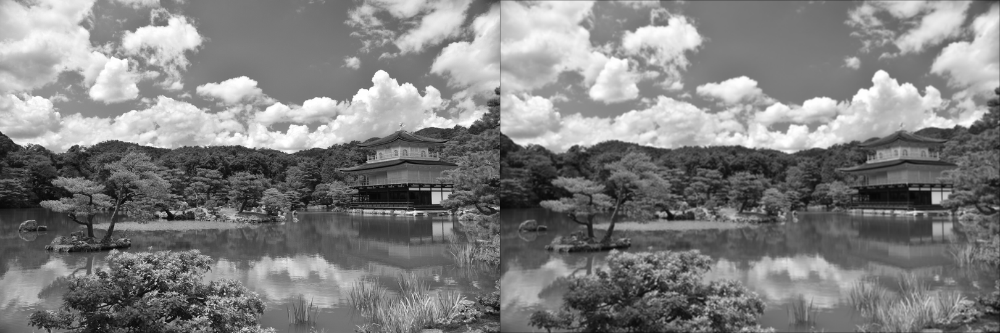

In [ ]:
conv.weight.data = torch.ones((1, 1, 3,3), dtype=torch.float) / 9.
print(conv.weight.data)
output = conv(input)
display(input, output)

### Gaussian blur

tensor([[[[0.0625, 0.1250, 0.0625],
          [0.1250, 0.2500, 0.1250],
          [0.0625, 0.1250, 0.0625]]]])


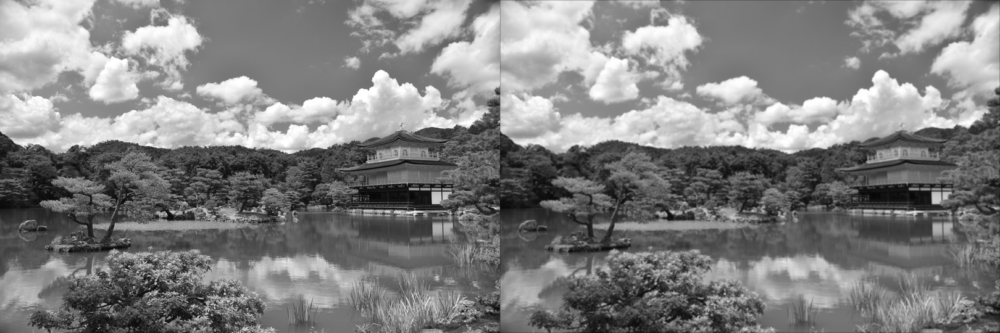

In [ ]:
conv.weight.data = torch.tensor([[[
    [1., 2., 1.],
    [2., 4., 2.],
    [1., 2., 1.],
]]])/16.
print(conv.weight.data)
output = conv(input)
display(input, output)

### Sharpen

tensor([[[[ 0., -1.,  0.],
          [-1.,  5., -1.],
          [ 0., -1.,  0.]]]])


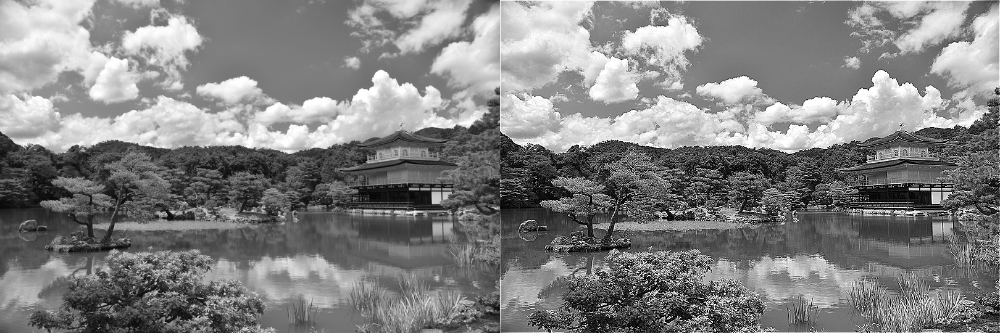

In [ ]:
conv.weight.data = torch.tensor([[[
    [0., -1., 0.],
    [-1., 5., -1.],
    [0., -1., 0.],
]]])
print(conv.weight.data)
output = conv(input)
display(input, output)

tensor([[[[ 0., -2.,  0.],
          [-2., 10., -2.],
          [ 0., -2.,  0.]]]])


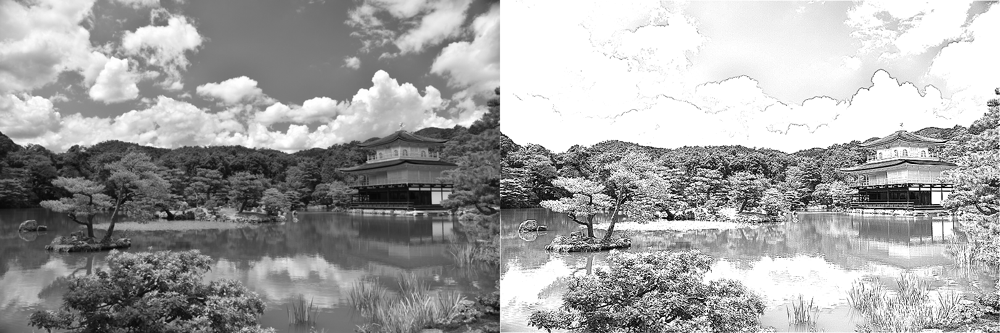

In [ ]:
conv.weight.data = torch.tensor([[[
    [0., -2., 0.],
    [-2., 10., -2.],
    [0., -2., 0.],
]]])
print(conv.weight.data)
output = conv(input)
display(input, output)

### Edge detection

tensor([[[[ 0.,  1.,  0.],
          [ 1., -4.,  1.],
          [ 0.,  1.,  0.]]]])


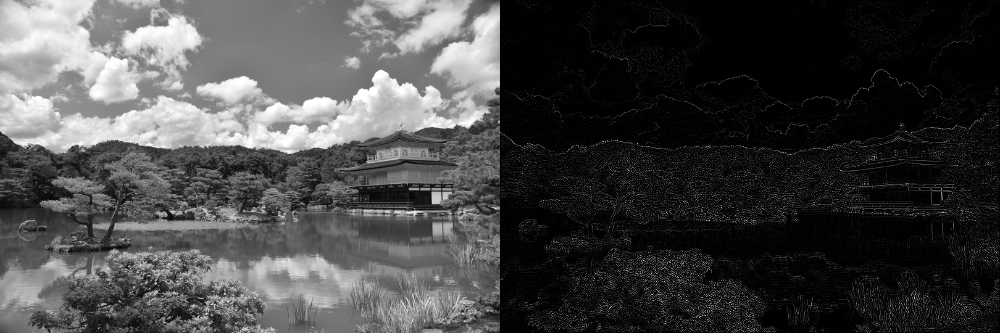

In [ ]:
conv.weight.data = torch.tensor([[[
    [0., 1., 0.],
    [1., -4., 1.],
    [0., 1., 0.],
]]])
print(conv.weight.data)
output = conv(input)
display(input, output)

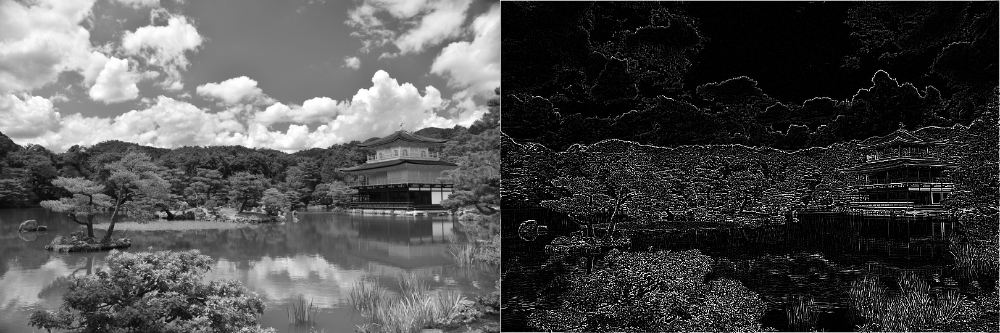

In [ ]:
conv.weight.data = torch.tensor([[[
    [-1., -1., -1.],
    [-1., 8., -1.],
    [-1., -1., -1.],
]]])
output = conv(input)
display(input, output)

Los ejercicios que deben agregarse a este proyecto serán los siguientes:

*  Implementa los detectores de línea siguientes usando código en Python (es decir, sin usar librerías de OpenCV): Prewitt, Sobel y Laplaciano. Investiga la complejidad algoritmica de estos, ¿cual es más eficiente?
*  Implementa un algoritmos de realce o mejoramiento de imágenes mediante un algoritmo de en el cual se extraen las líneas de la imagen y después se aplica la diferencia con la imagen original, multiplicando los píxeles de la imagen “máscara” (las líneas encontradas) por un factor alfa mayor a 1.
*  Buscar una aplicación médica (en el libro de Gonzalez viene varios ejemplos de imágenes PET) y hacer mejoramiento usando la técnica de de la Figura 3.43 combinando diferentes etapas de procesamiento de imagenes

In [ ]:
id_edificio = '15dJXFxKMbc2eKq5L_TEBO4WPiH2apc-Q'
imagen = 'edificio.JPEG'
ruta_edificio = os.path.join(ruta_imagenes, imagen)

gdown.download(id=id_edificio, output=ruta_edificio, quiet=True)

'/home/jarcos/Imagenes_dominio_espacial/edificio.JPEG'

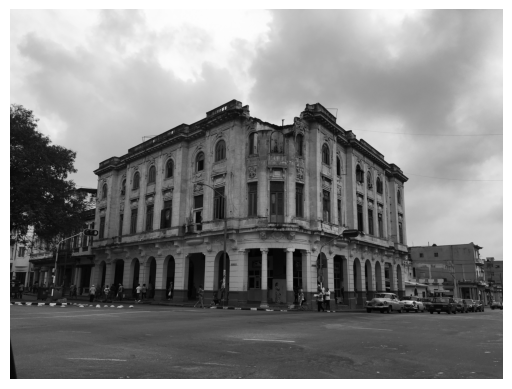

Objeto: <PIL.Image.Image image mode=L size=4032x3024 at 0x7F657AA7E2B0>
Formato: None
Tamaño (Ancho x Alto): (4032, 3024)
Modo de color: L


In [ ]:
imagen = Image.open(ruta_edificio)
imagen_bw = imagen.convert('L').rotate(180) # convertir imagen a blanco y negro

plt.imshow(imagen_bw, cmap='gray')
plt.axis('off')
plt.show()

print(f"Objeto: \033[36m{imagen_bw}\033[0m")
print(f"Formato: \033[36m{imagen_bw.format}\033[0m")
print(f"Tamaño (Ancho x Alto): \033[36m{imagen_bw.size}\033[0m")
print(f"Modo de color: \033[36m{imagen_bw.mode}\033[0m")


Detectores Prewitt y Sobel
Los detectores de Prewitt y Sobel son filtros de gradiente que detectan los bordes al calcular la primera derivada de la intensidad de los píxeles. Utilizan dos kernels (uno horizontal y uno vertical) para encontrar los gradientes en ambas direcciones (G_x y G_y). El gradiente total del borde (G) se calcula con la fórmula:


In [ ]:
def convolution_2d(image, kernel):

  rows, cols = image.shape
  k_rows, k_cols = kernel.shape

  output = np.zeros_like(image, dtype=float)

  padded_image = np.pad(image, ((k_rows//2, k_rows//2), (k_cols//2, k_cols//2)), mode='edge')

  for i in range(rows):
        for j in range(cols):

            region = padded_image[i:i+k_rows, j:j+k_cols]

            output[i, j] = np.sum(region * kernel)
  return output

In [ ]:
def prewitt_detector(image_path):

  img_array = np.array(image_path, dtype=float)

  prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
  prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

  gx = convolution_2d(img_array, prewitt_x)
  gy = convolution_2d(img_array, prewitt_y)

  gradient_magnitude = np.sqrt(gx**2 + gy**2)

  gradient_magnitude = np.uint8(255 * gradient_magnitude / np.max(gradient_magnitude))

  return Image.fromarray(gradient_magnitude)

In [ ]:
imagen_prewitt = prewitt_detector(imagen_bw)

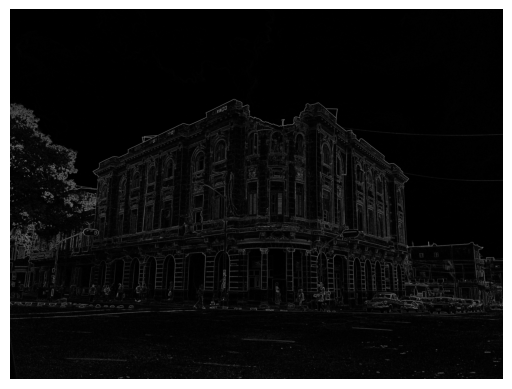

In [ ]:
#plt.imshow(imagen_prewitt, cmap='gray',vmin=0.0, vmax=1.0)
plt.imshow(imagen_prewitt, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
def sobel_detector(image_path):

  img_array = np.array(image_path, dtype=float)

  sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
  sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

  gx = convolution_2d(img_array, sobel_x)
  gy = convolution_2d(img_array, sobel_y)

  gradient_magnitude = np.sqrt(gx**2 + gy**2)

  gradient_magnitude = np.uint8(255 * gradient_magnitude / np.max(gradient_magnitude))

  return Image.fromarray(gradient_magnitude)

In [ ]:
#tarda 5 minutos
imagen_sobel = sobel_detector(imagen_bw)

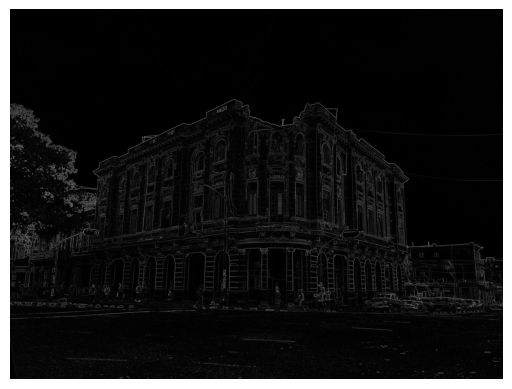

In [ ]:
plt.imshow(imagen_sobel, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:


def laplacian_detector(image_path,sigma=1.4):

  img_array = np.array(image_path, dtype=float)
  smoothed_image = gaussian_filter(img_array, sigma=sigma)

  laplacian_kernel = np.array([[1,  1, 1],
                               [1, -8, 1],
                               [1,  1, 1]])

  laplacian_result = convolve2d(smoothed_image, laplacian_kernel, mode='same', boundary='symm')
  clipped_result = np.clip(laplacian_result, 0, 255)

  final_image_array = clipped_result.astype(np.uint8)

  return Image.fromarray(final_image_array)

In [ ]:
#tarda 2 minutos
imagen_laplacian = laplacian_detector(imagen_bw)

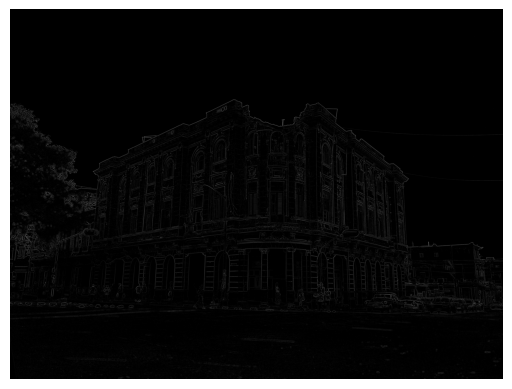

In [ ]:
plt.imshow(imagen_laplacian, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
def sharp_color (image_path, alpha=2.0):

  img_gris = (image_path[:, :, 0] * 0.299 +
                image_path[:, :, 1] * 0.587 +
                image_path[:, :, 2] * 0.114)

  kernel_laplaciano = np.array([
        [0,  1,  0],
        [1, -4,  1],
        [0,  1,  0]
    ])

  mascara = convolve2d(img_gris, kernel_laplaciano, mode='same', boundary='symm')
  mascara_3d = np.stack([mascara] * 3, axis=-1)
  img_mejorada = image_path - (alpha * mascara_3d)
  img_mejorada = np.clip(img_mejorada, 0, 255)

  img_original_uint8 = image_path.astype(np.uint8)
  mascara_abs_uint8 = np.clip(np.abs(mascara), 0, 255).astype(np.uint8)
  img_mejorada_uint8 = img_mejorada.astype(np.uint8)

  return img_original_uint8, mascara_abs_uint8, img_mejorada_uint8

In [ ]:
#tarda 2 minutos

imagen = imagen.rotate(180)
img_original = np.array(imagen, dtype=np.float32)
original, mascara, mejorada = sharp_color(img_original,10)

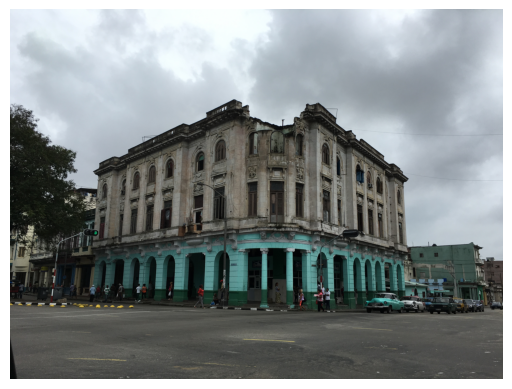

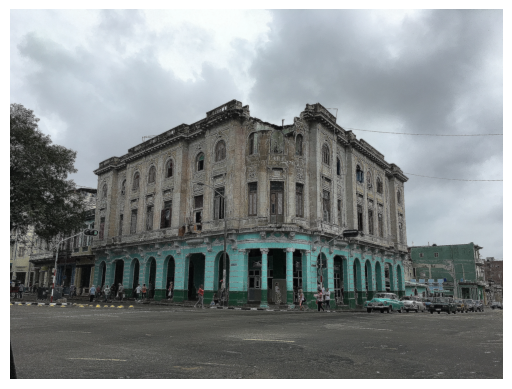

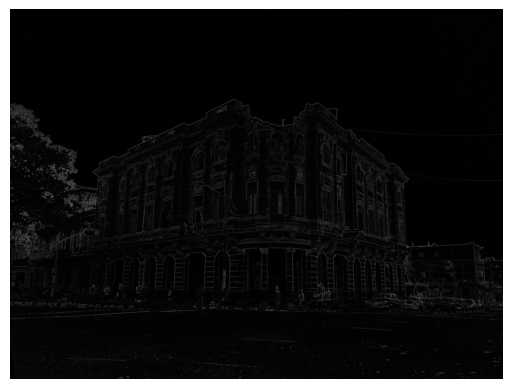

In [ ]:
plt.imshow(original, cmap='gray')
plt.axis('off')
plt.show()

plt.imshow(mejorada, cmap='gray')
plt.axis('off')
plt.show()

plt.imshow(mascara, cmap='gray')
plt.axis('off')
plt.show()


In [ ]:
def sharp_gris(ruta_imagen, alpha=2):

  img_array = np.array(ruta_imagen, dtype=float)

  kernel_laplaciano = np.array([
        [1,  1,  1],
        [1, -8,  1],
        [1,  1,  1]
    ])

  mascara = convolve2d(img_array, kernel_laplaciano, mode='same', boundary='symm')
  img_resultante = img_array - (alpha * mascara)

  img_resultante = np.clip(img_resultante, 0, 255)

  img_original_uint8 = img_array.astype(np.uint8)
  mascara_abs_uint8 = np.clip(np.abs(mascara), 0, 255).astype(np.uint8)
  img_mejorada_uint8 = img_resultante.astype(np.uint8)


  return img_original_uint8, mascara_abs_uint8, img_mejorada_uint8


In [ ]:
original, mascara, mejorada = sharp_gris(imagen_bw,2)

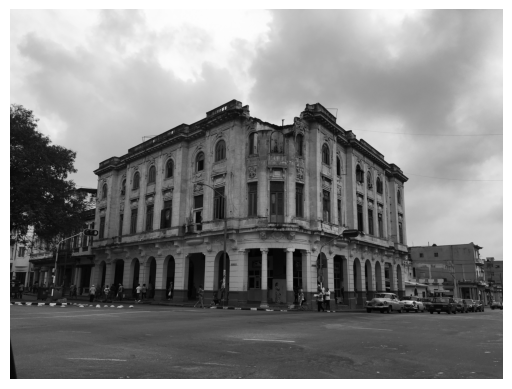

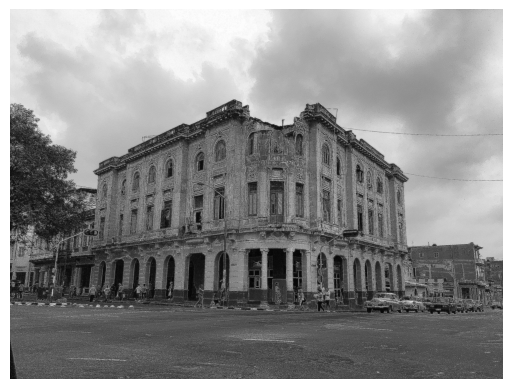

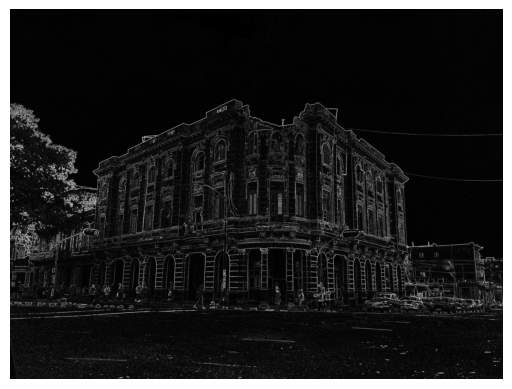

In [ ]:
plt.imshow(original, cmap='gray')
plt.axis('off')
plt.show()

plt.imshow(mejorada, cmap='gray')
plt.axis('off')
plt.show()

plt.imshow(mascara, cmap='gray')
plt.axis('off')
plt.show()

